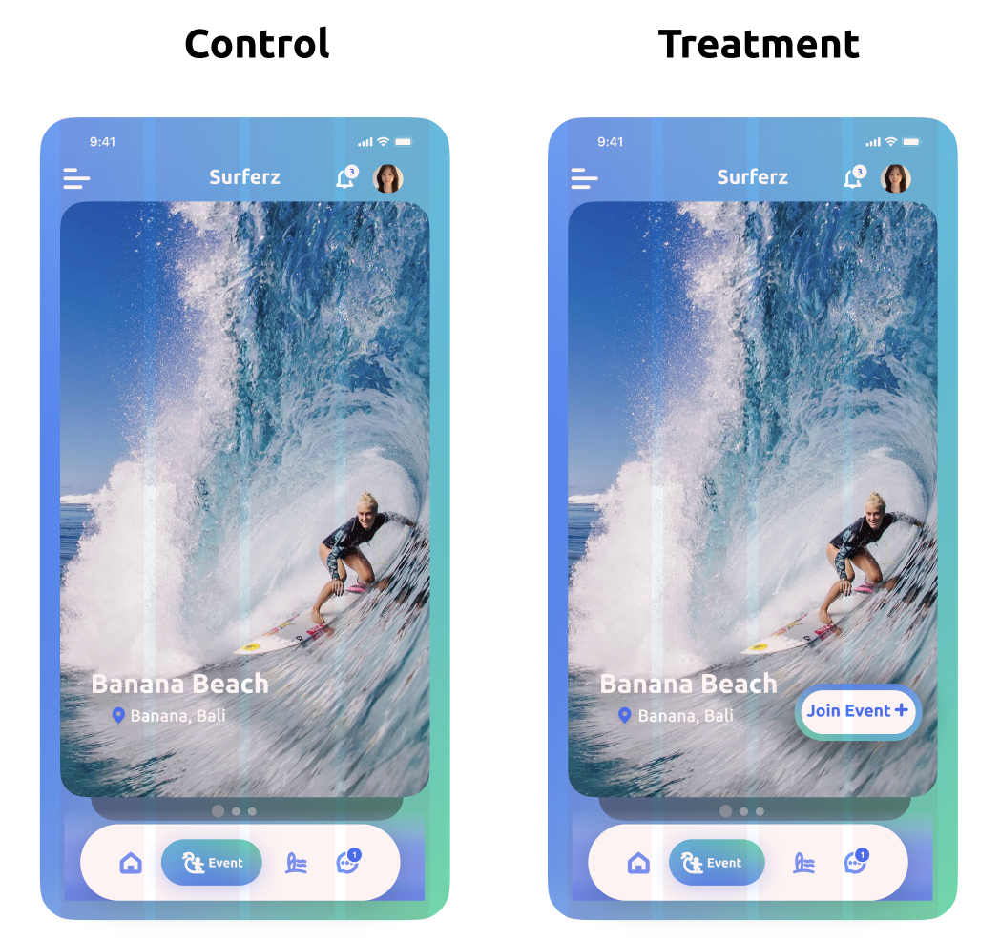

In [1]:
from PIL import Image 
Image.open('/Users/haiyanqin/Desktop/surferz.png')

In [2]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind

%matplotlib inline
import pygwalker as pyg
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
# Define simulation parameters
population_size = 10000
total_days = 7

# Simulate unique user_ids
user_ids = np.arange(1, population_size + 1)

# Ensure equal distribution of users to groups
# Half of the population to each group, then shuffle
group_labels = np.array(['control'] * (population_size // 2) + ['treatment'] * (population_size // 2))
np.random.shuffle(group_labels)

# Assign users to groups
groups = group_labels

# Simulate timestamps (In day)
timestamps = np.random.choice(pd.date_range('2024-03-01', periods=total_days, freq='D'), size=population_size)

# Simulate more clicks on 'Join Event' CTA for treatment group
click_through_rate_control = 0.05
click_through_rate_treatment = 0.05 * 1.2  # MDE 20% lift
clicks_on_cta = np.where(groups == 'control', 
                         np.random.binomial(1, click_through_rate_control, population_size), 
                         np.random.binomial(1, click_through_rate_treatment, population_size))

average_booking_control = 2
average_booking_treatment = 3  # Assuming higher bookings for the treatment group
activity_bookings = np.where(groups == 'control', 
                             np.random.poisson(average_booking_control, population_size), 
                             np.random.poisson(average_booking_treatment, population_size))

average_order_value_control = 50  
average_order_value_treatment = 70  
order_value = np.where(groups == 'control', 
                       np.random.normal(average_order_value_control, 10, population_size),  # Assuming some variation in order value
                       np.random.normal(average_order_value_treatment, 15, population_size))

average_time_spent_control = 300  
average_time_spent_treatment = 360  # Example for treatment group with a 20% increase
time_spent_sec = np.where(groups == 'control', 
                                 np.random.normal(average_time_spent_control, 50, population_size), 
                                 np.random.normal(average_time_spent_treatment, 60, population_size))

simulated_df = pd.DataFrame({
    'user_id': user_ids,
    'group': groups,
    'timestamp': timestamps,
    'clicks_on_cta': clicks_on_cta,
    'activity_bookings': activity_bookings,
    'order_value': order_value,
    'time_spent_sec': time_spent_sec
})

simulated_df.head()


,user_id,group,timestamp,clicks_on_cta,activity_bookings,order_value,time_spent_sec
0,1,control,2024-03-01,0,2,61.613904,254.468037
1,2,treatment,2024-03-01,0,2,63.165791,391.986645
2,3,treatment,2024-03-06,0,5,72.403116,376.893706
3,4,control,2024-03-05,0,2,53.379089,267.429681
4,5,treatment,2024-03-05,0,6,79.000850,342.130885


In [4]:
#Double check if sample size equal
group_counts = simulated_df['group'].value_counts()
print(group_counts)


group
control      5000
treatment    5000
Name: count, dtype: int64


In [5]:
simulated_df.describe()

,user_id,timestamp,clicks_on_cta,activity_bookings,order_value,time_spent_sec
count,10000.00000,10000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,2024-03-04 00:32:15.360000,0.051700,2.492700,59.999373,330.460200
min,1.00000,2024-03-01 00:00:00,0.000000,0.000000,13.481180,127.511505
25%,2500.75000,2024-03-02 00:00:00,0.000000,1.000000,47.907200,285.870934
50%,5000.50000,2024-03-04 00:00:00,0.000000,2.000000,58.074458,327.379252
75%,7500.25000,2024-03-06 00:00:00,0.000000,3.000000,71.211341,372.532177
max,10000.00000,2024-03-07 00:00:00,1.000000,13.000000,122.720639,578.154430
std,2886.89568,NaN,0.221432,1.661933,16.324142,63.604138


In [6]:
pyg.walk(simulated_df)

Box(children=(HTML(value='<div id="ifr-pyg-0006135254f11391sfeIMkVlaFv170Cj" style="height: auto">\n    <head>…

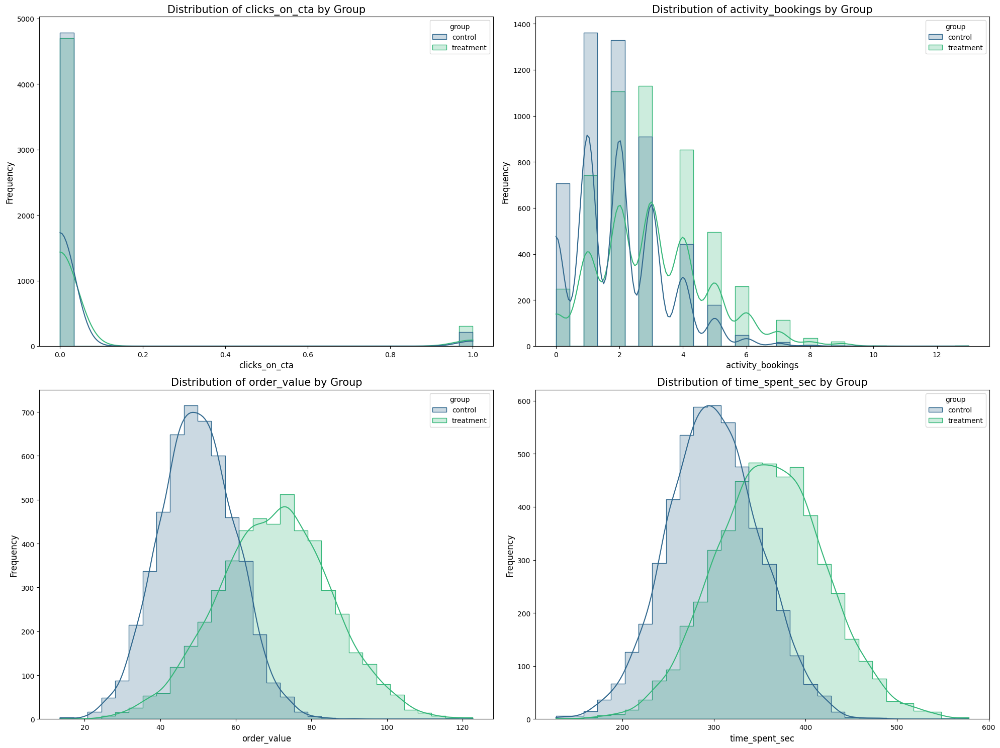

In [7]:
# Creating a figure to accommodate the subplots
plt.figure(figsize=(20, 15))

var_for_scatter = ['clicks_on_cta', 'activity_bookings', 'order_value','time_spent_sec']

# frequency plot with KDE for each 
for index, variable in enumerate(var_for_scatter, 1):
    plt.subplot(2, 2, index)
    sns.histplot(data=simulated_df, x=variable, hue='group', kde=True, bins=30, element='step', palette='viridis')
    plt.title(f'Distribution of {variable} by Group', fontsize=15)
    plt.xlabel(variable, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)

plt.tight_layout()
plt.show()

## Relationship between clicks on the 'Join Event' CTA, activity bookings, and order value with the time spent in seconds

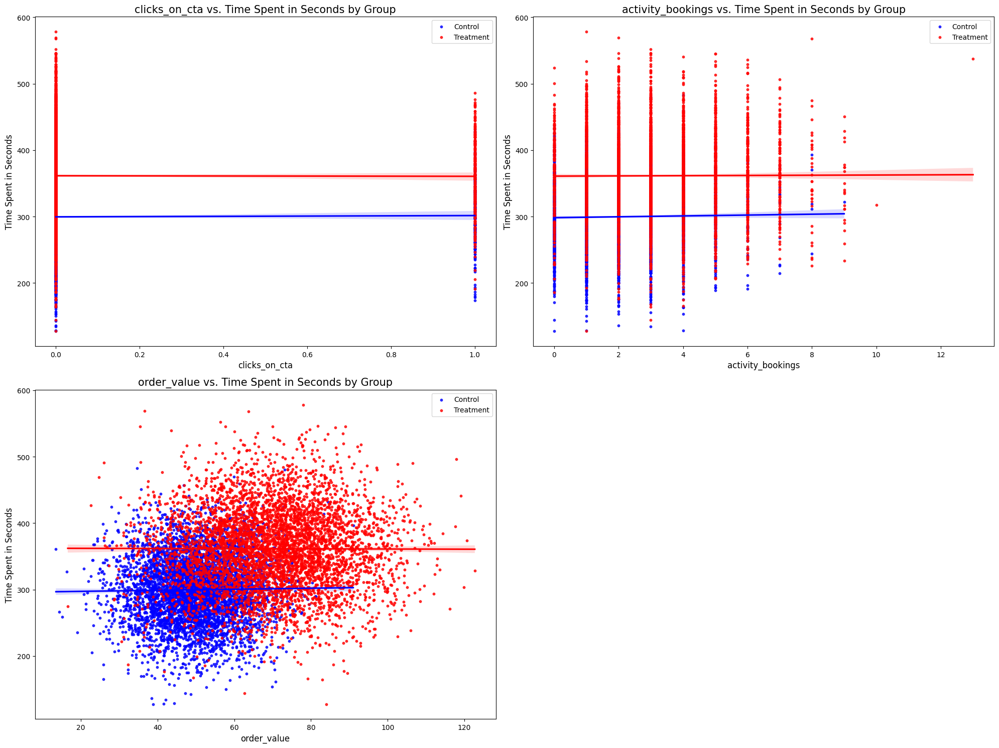

In [8]:
# Creating a figure to accommodate the scatter plots with regression lines
plt.figure(figsize=(20, 15))

# List of variables to compare with 'time_spent_in_sec'
variables_for_scatter = ['clicks_on_cta', 'activity_bookings', 'order_value']

# scatter plot with a regression line for each variable comparison
for index, variable in enumerate(variables_for_scatter, 1):
    plt.subplot(2, 2, index)
    sns.regplot(data=simulated_df[simulated_df['group'] == 'control'], x=variable, y='time_spent_sec', color='blue', label='Control', scatter_kws={'s':10}, line_kws={"color": "blue"})
    sns.regplot(data=simulated_df[simulated_df['group'] == 'treatment'], x=variable, y='time_spent_sec', color='red', label='Treatment', scatter_kws={'s':10}, line_kws={"color": "red"})
    plt.title(f'{variable} vs. Time Spent in Seconds by Group', fontsize=15)
    plt.xlabel(variable, fontsize=12)
    plt.ylabel('Time Spent in Seconds', fontsize=12)
    plt.legend()

plt.tight_layout()
plt.show()

## Daily revenue

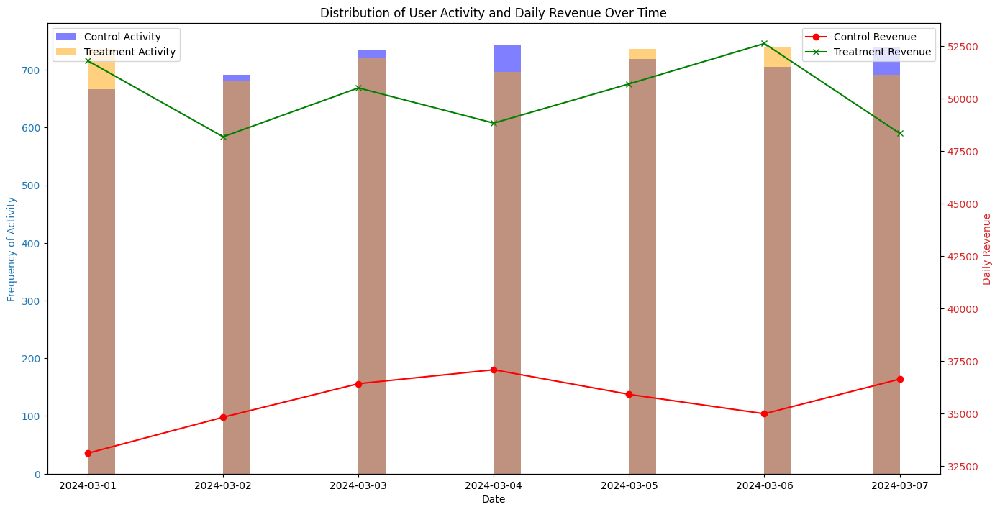

In [9]:
# Calculating daily revenue for each group
simulated_df['date'] = simulated_df['timestamp'].dt.date
daily_revenue = simulated_df.groupby(['date', 'group'])['order_value'].sum().unstack()

# Plotting user activity over time
fig, ax1 = plt.subplots(figsize=(14, 7))

color = 'tab:blue'
ax1.set_xlabel('Date')
ax1.set_ylabel('Frequency of Activity', color=color)
ax1.hist(simulated_df[simulated_df['group'] == 'control']['timestamp'], bins=30, alpha=0.5, label='Control', color='blue')
ax1.hist(simulated_df[simulated_df['group'] == 'treatment']['timestamp'], bins=30, alpha=0.5, label='Treatment', color='orange')
ax1.tick_params(axis='y', labelcolor=color)
ax1.legend(['Control Activity', 'Treatment Activity'], loc='upper left')

# Instantiating a second y-axis to plot daily revenue
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Daily Revenue', color=color)  # we already handled the x-label with ax1
ax2.plot(daily_revenue.index, daily_revenue['control'], color='red', marker='o', label='Control Revenue')
ax2.plot(daily_revenue.index, daily_revenue['treatment'], color='green', marker='x', label='Treatment Revenue')
ax2.tick_params(axis='y', labelcolor=color)
ax2.legend(loc='upper right')

fig.tight_layout()  # ensure there's no clipping of ylabel
plt.title('Distribution of User Activity and Daily Revenue Over Time')
plt.xticks(rotation=45)
plt.show()

## Comparing Click-through Rates between Control and Treatment

In [10]:
from scipy.stats import chi2_contingency

# Create a contingency table
contingency_table = pd.crosstab(simulated_df['group'], simulated_df['clicks_on_cta'])

# Perform chi-square test
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
print("Chi-square Statistic:", chi2_stat)
print("P-value:", p_value)


Chi-square Statistic: 16.5214714879176
P-value: 4.810226331977549e-05


## Comparing Average Activity Bookings between Control and Treatment 

T-statistic: -32.73799163961374
P-value: 2.110037536884526e-223


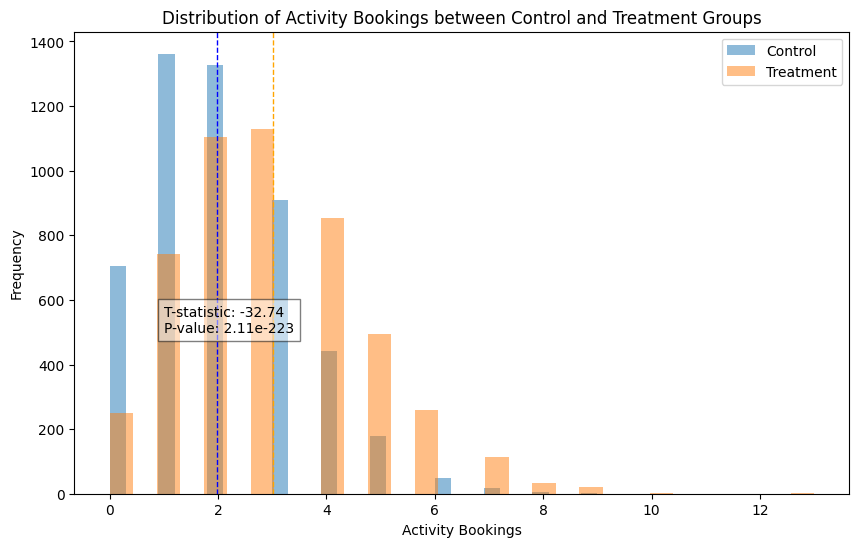

(-32.73799163961374, 2.110037536884526e-223)

In [11]:
control_activity = simulated_df[simulated_df['group'] == 'control']['activity_bookings']
treatment_activity = simulated_df[simulated_df['group'] == 'treatment']['activity_bookings']

t_statistic, p_value = ttest_ind(control_activity, treatment_activity)
print("T-statistic:", t_statistic)
print("P-value:", p_value)

# Plotting
plt.figure(figsize=(10, 6))
plt.hist(control_activity, bins=30, alpha=0.5, label='Control')
plt.hist(treatment_activity, bins=30, alpha=0.5, label='Treatment')
plt.title('Distribution of Activity Bookings between Control and Treatment Groups')
plt.xlabel('Activity Bookings')
plt.ylabel('Frequency')
plt.legend()
plt.axvline(control_activity.mean(), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(treatment_activity.mean(), color='orange', linestyle='dashed', linewidth=1)
plt.text(x=1, y=500, s=f"T-statistic: {t_statistic:.2f}\nP-value: {p_value:.2e}", bbox=dict(facecolor='white', alpha=0.5))

plt.show()

(t_statistic, p_value)

## Comparing Average Order Value between Control and Treatment

T-statistic: -55.52962374233183
P-value: 0.0


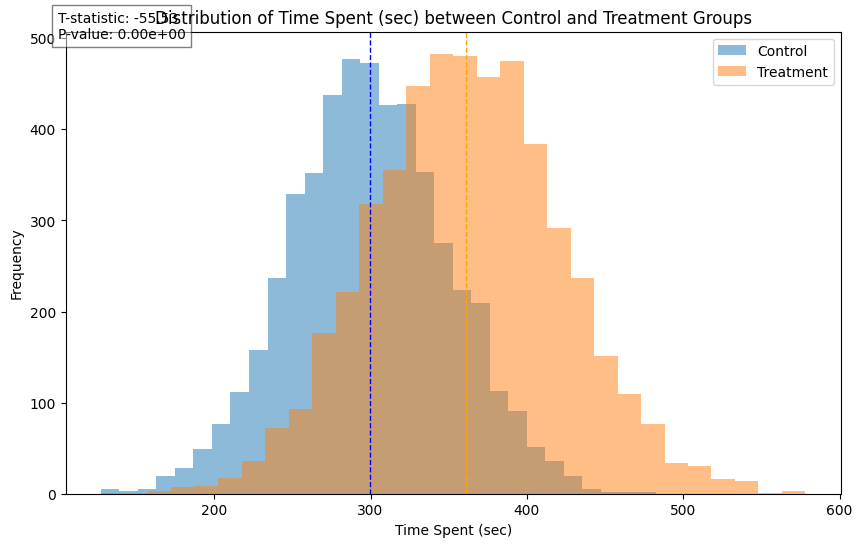

In [12]:
control_time_spent = simulated_df[simulated_df['group'] == 'control']['time_spent_sec']
treatment_time_spent = simulated_df[simulated_df['group'] == 'treatment']['time_spent_sec']

t_statistic, p_value = ttest_ind(control_time_spent, treatment_time_spent)
print("T-statistic:", t_statistic)
print("P-value:", p_value)

# Plotting the distribution of time spent for both control and treatment groups
plt.figure(figsize=(10, 6))
plt.hist(control_time_spent, bins=30, alpha=0.5, label='Control')
plt.hist(treatment_time_spent, bins=30, alpha=0.5, label='Treatment')
plt.title('Distribution of Time Spent (sec) between Control and Treatment Groups')
plt.xlabel('Time Spent (sec)')
plt.ylabel('Frequency')
plt.legend()
plt.axvline(control_time_spent.mean(), color='blue', linestyle='dashed', linewidth=1)
plt.axvline(treatment_time_spent.mean(), color='orange', linestyle='dashed', linewidth=1)
plt.text(x=100, y=500, s=f"T-statistic: {t_statistic:.2f}\nP-value: {p_value:.2e}", bbox=dict(facecolor='white', alpha=0.5))

plt.show()
